# Visualizing Kernels and Feature Maps in Deep Learning Model (CNN)
Convolution's concept is powerful and can significantly increase the efficiency of the Neural Network Model, especially in the present day where computer hardware such as GPU is much cheaper than it used to be.

CNN (Convolutional Neural Network) is a structure within the Deep Learning Model that uses the Convolution concept to work with 2D data, such as Image Data, where each Image's Pixel is associated with spatial relationships.

CNN consists of kernel and results from kernel mathematical actions with input image called Activation Map or Feature Map.
In this article, readers will understand the concept of CNN and do a workshop to bring out the Fashion-MNIST Model's Kernel and Feature Map.

## 2D Convolutions Concept
While the kernel is applied on input image, it multiplies the pixel value of input image and kernel, and then brings all the results plus one pixel dot of feature map (green right hand).

2D Convolution, where feature maps are created by importing kernel slide on input image, uses less parameter than Fully Connected Layer.
<img src="https://miro.medium.com/max/875/1*Fw-ehcNBR9byHtho-Rxbtw.gif">

### The Convolution Operation
<img src="https://miro.medium.com/max/669/1*XrnKZT2Lz0fE6Nt5PvYxQA.gif">
In the example, to import a 5x5 Pixel image into the model, 2D Convolution Layer uses the number of Parameters equal to the size of the Kernel is 3x3 = 9 Parameter.

## Padding
While the Slide Kernel is located on the edge of the blue image, there is no way to center the kernel when it is applied, because we can't expand the kernel beyond the edge of the image, thus making the Feature Map smaller than input image.
<img src="https://miro.medium.com/max/494/1*zg5gP3710r5Q6fbJIIudNQ.gif">
## Striding
Striding is a process of convolution by sliding the Kernel sheet to the Input Image.
When stride is set to 2, the 3x3 kernel is slide across the 5x5 Input Image Pixel at a time, resulting in a 2x2 Feature Map as shown below.
<img src="https://miro.medium.com/max/368/1*_-pUc0MOt8j9DJi8Cletlg.gif"> 
## Pooling
In addition to reducing the size of the image by increasing the Stride by slide kernel across input image's Pixel at a certain distance, there is another way to reduce the size of the image: max pooling or average pooling.

Max Pooling or Average Pooling selects the image's agent by determining the maximum value or pixel average in the window to a certain size, such as a 2x2 size, which reduces the image size by half as shown above.
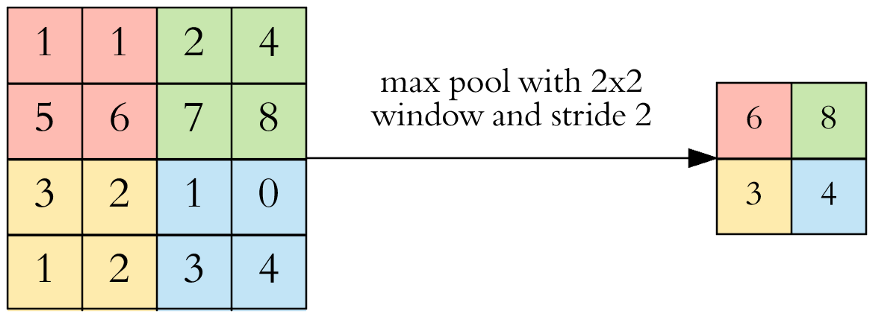

## Multi-channel
For example, rgb color images require 3 kernels to slide on each Input Image Channel, which we call the Filter 3 (hereinafter 1 Filter contains 3 Kernels).
<img src="https://miro.medium.com/max/875/1*H-5s9xIXy8kmrAYfOt77Ow.gif">
Each 3x3 version of the Slide Kernel on the 5x5 Input Channel is combined into the Output Channel 1 Channel to be forwarded to the next Neural Network Layer.
<img src="https://miro.medium.com/max/875/1*81p7p4eG3texr2Vlr5mL6A.gif">

The output channel is positively integrated with Bias in the final stages of the Convolution process.
<img src="https://miro.medium.com/max/368/1*oKDN_NXn0K2zwj-d40WQ2g.gif">

In order to create an Output Channel 1 Channel, the image must be used with Filter 1 Filter, each of which consists of a number of Kernel 3 Kernels.
# Visualizing CNN
For readers with GPU can config applications with the following command:

In [1]:
import tensorflow as tf
print(tf.__version__)

2.3.1


In [2]:
config = tf.compat.v1.ConfigProto()
config.gpu_options.allow_growth = True
sess = tf.compat.v1.Session(config=config)

print('Tensorflow Version: ', tf.__version__)
print('GPU Available:: ', tf.config.list_physical_devices('GPU'))

Tensorflow Version:  2.3.1
GPU Available::  [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [3]:
from tensorflow.keras.layers import Dense, Flatten, Conv2D, Dropout, Activation, BatchNormalization, MaxPool2D
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.datasets import fashion_mnist
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.python.keras.models import load_model

from sklearn.model_selection import train_test_split

import numpy as np
import matplotlib.pyplot as plt

import plotly.graph_objs as go
from plotly import tools
import plotly

import cv2

%matplotlib inline

In [19]:
'''
Read the cat's file and try to import the CNN Model that has not yet been taken by train following the procedure:
Read the meow image file
'''
shoe = cv2.imread('image.jpg')
shoe.shape

(1440, 1080, 3)

In [20]:
shoe = cv2.cvtColor(shoe, cv2.COLOR_RGB2BGR)

(1440, 1080, 3)

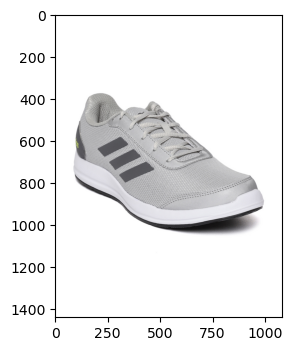

In [21]:
plt.figure(dpi=100)
plt.imshow(cat)
shoe.shape

## Create a Model with 2D CNN Layer
2D Convolution model definition by receiving 1,440x1,080 Pixel 3 Channel input with 3x3 filter to slide on each channel input image.
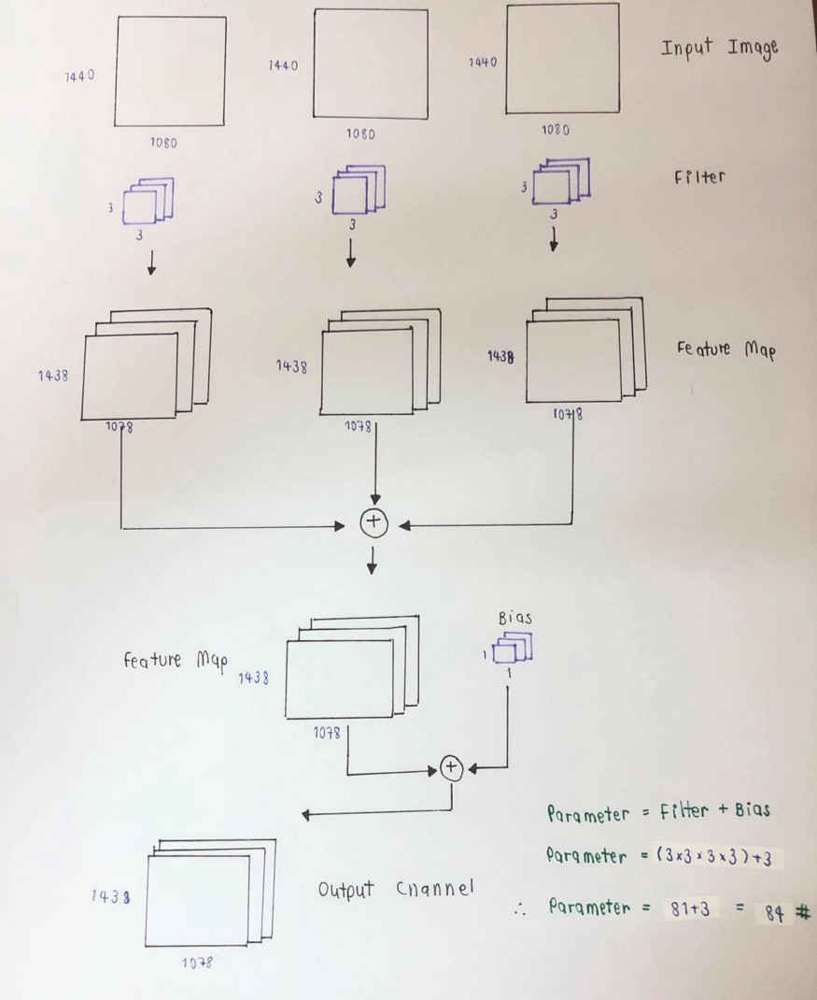

From the image above, our Model will have a parameter of 3x3x3x3x3 + 3 = 84 Parameter.

In [22]:
model = Sequential()
model.add(Conv2D(3, # number of filter layers
                (3, # y dimension of kernel
                 3), # x dimension of kernel
                 input_shape=shoe.shape))

model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 1438, 1078, 3)     84        
Total params: 84
Trainable params: 84
Non-trainable params: 0
_________________________________________________________________


Experiment with expanding the dimensions of 3D images to 4Ds to prepare for the import of Predict Function.

In [23]:
shoe_batch = np.expand_dims(shoe, axis=0)
shoe_batch.shape

(1, 1440, 1080, 3)

In [24]:
'''
Try to predict the model using random weight and bias values at the beginning without the Train Model.
'''
conv_shoe = model.predict(shoe_batch)
conv_shoe.shape

(1, 1438, 1078, 3)

Because we have a Model definition by setting the filter number to 3 Filter, it enables all 1438 x 1078 output channels to be reduced to 1440 x 1080 Pixels due to a 3x3 Slide Kernel on the Input Image without padding.

Defines visualize_cat function that receives the image as matrix, expands the image to 4D, then predict the image before shrinking to 3D to continue to plot the image.

In [25]:
def vis_shoe(model, shoe):
    shoe_batch = np.expand_dims(shoe, axis=0)
    conv_shoe = model.predict(shoe_batch)
    conv_shoe = np.squeeze(conv_shoe, axis=0)
    print(conv_shoe.shape)
    conv_shoe = cv2.cvtColor(conv_shoe, cv2.COLOR_RGB2BGR)
    plt.imshow(conv_shoe)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(1438, 1078, 3)


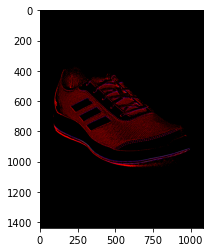

In [26]:
vis_shoe(model, shoe)

In [27]:
'''
2D Convolution model definition by receiving 1,440x1,080 Pixel 3 
Channel Image input with 3 10x10 filters to slide on each Channel Image Input.
'''
model = Sequential()
model.add(Conv2D(3, (10, 10), input_shape=shoe.shape))

model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_2 (Conv2D)            (None, 1431, 1071, 3)     903       
Total params: 903
Trainable params: 903
Non-trainable params: 0
_________________________________________________________________


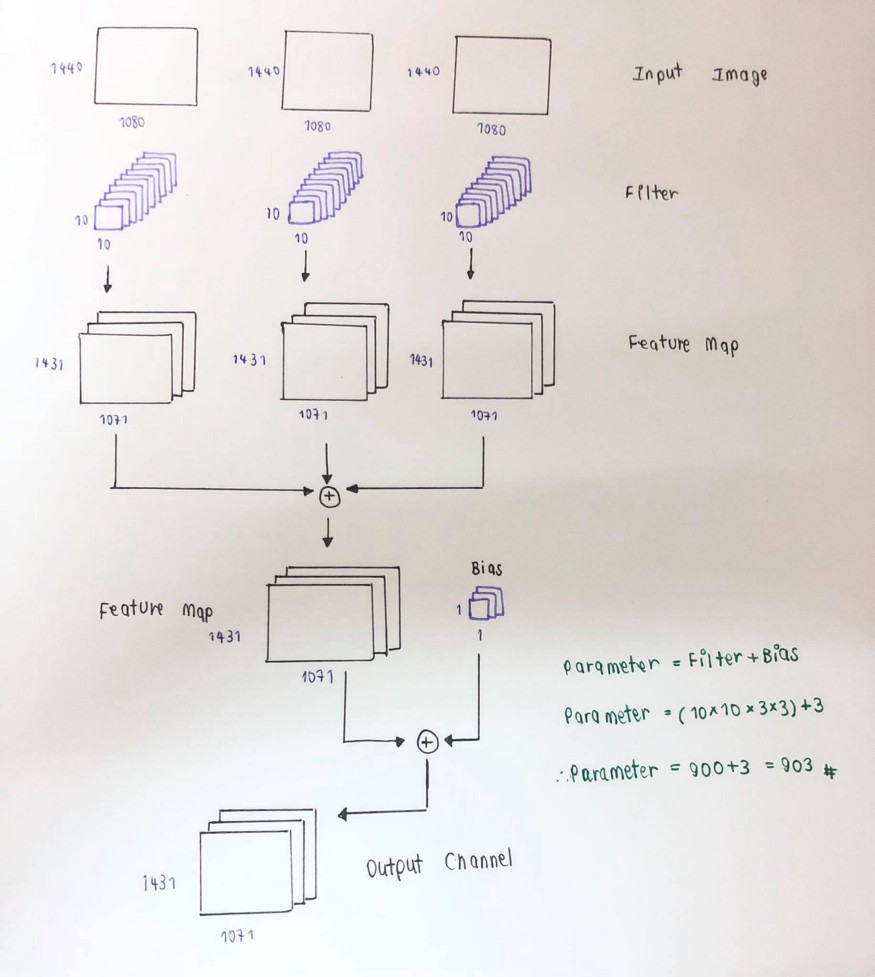

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(1431, 1071, 3)


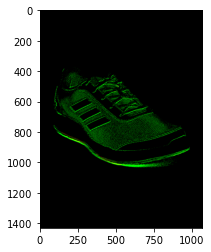

In [28]:
# Plot the pic
vis_shoe(model, shoe)

2D Convolution Model Definition with 1,440x1,080 Pixel 3 Channel Input with 1 3x3 Filter
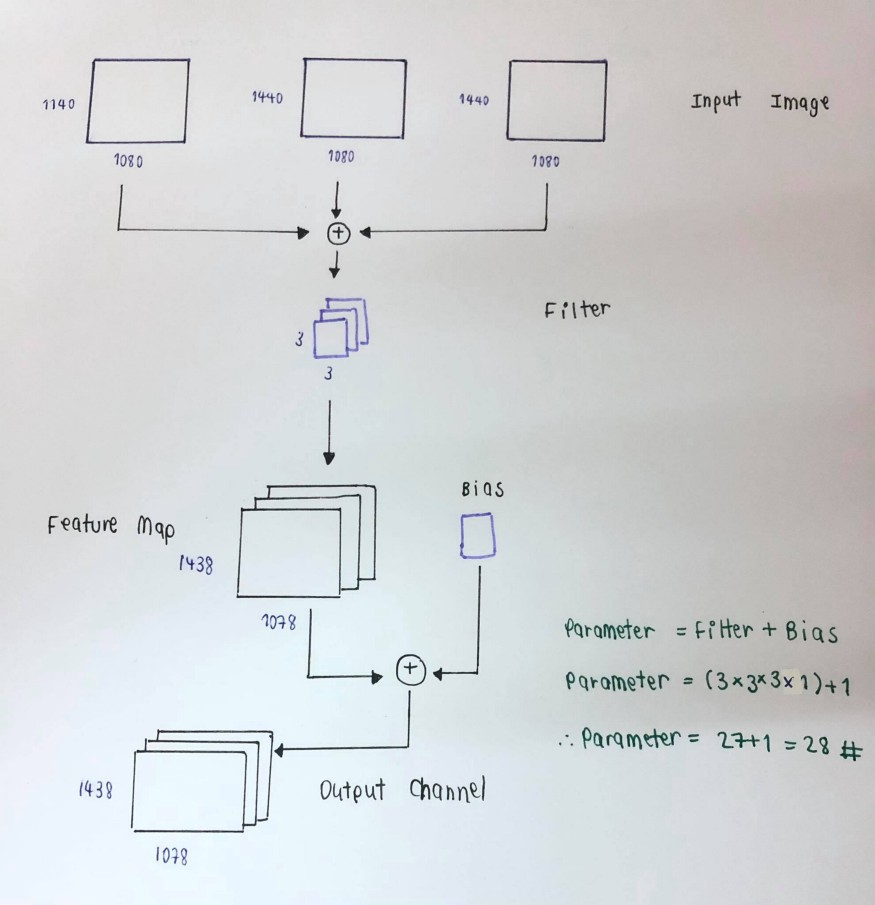

In [29]:
model = Sequential()
model.add(Conv2D(1, (3, 3), input_shape=shoe.shape))

model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_3 (Conv2D)            (None, 1438, 1078, 1)     28        
Total params: 28
Trainable params: 28
Non-trainable params: 0
_________________________________________________________________


In [32]:
#Defines visualize_cat_one_channel function as matrix, expand the image into 4D, predict the image before shrinking 
# to 2D in order to plot the 1 channel image.
def vis_shoe_one_channel(model, shoe):
    shoe_batch = np.expand_dims(shoe, axis=0)
    conv_shoe2 = model.predict(shoe_batch)
    conv_shoe2 = np.squeeze(conv_shoe2, axis=0)
    conv_shoe2 = conv_shoe2.reshape(conv_shoe2.shape[:2])
    plt.imshow(conv_shoe2)

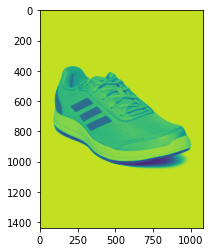

In [33]:
vis_shoe_one_channel(model, shoe)

2D Convolution Model Definition with 1,440x1,080 Pixel 3 Channel Input with 1 20x20 Filter
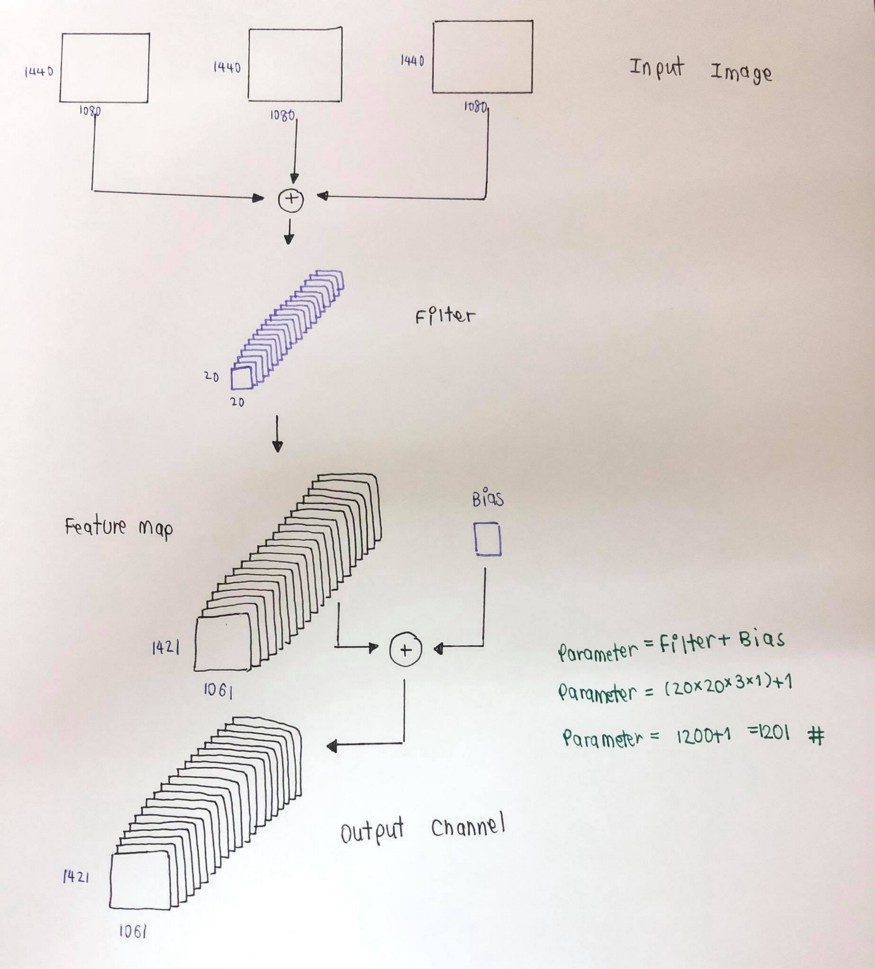

In [34]:
model = Sequential()
model.add(Conv2D(1, (20, 20), input_shape=shoe.shape))

model.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_4 (Conv2D)            (None, 1421, 1061, 1)     1201      
Total params: 1,201
Trainable params: 1,201
Non-trainable params: 0
_________________________________________________________________


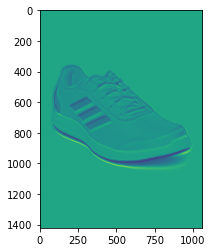

In [35]:
vis_shoe_one_channel(model, shoe)

2D Convolution Model Definition by 3 Channel 1440x1080 Pixel Image Input with 10x20 Filter and ReLu Activation Function
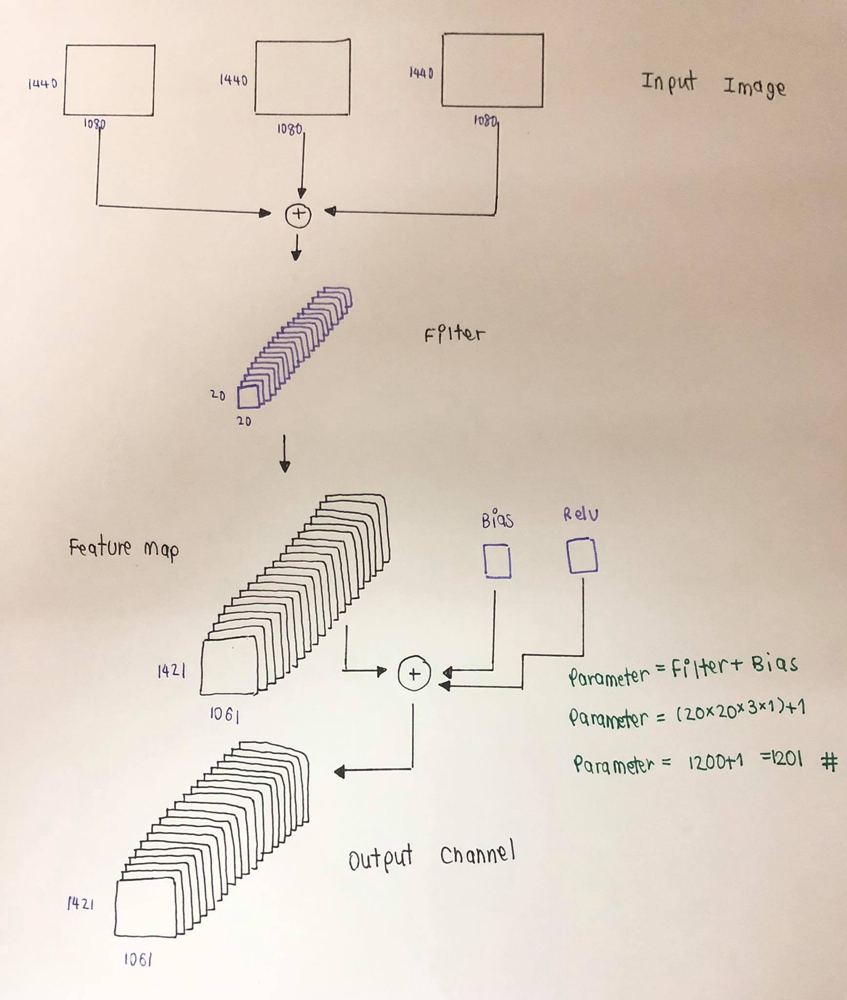

In [41]:
model = Sequential()
model.add(Conv2D(1, (20, 20), input_shape=shoe.shape))
model.add(Activation('relu'))

model.summary()

Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_8 (Conv2D)            (None, 1421, 1061, 1)     1201      
_________________________________________________________________
activation_3 (Activation)    (None, 1421, 1061, 1)     0         
Total params: 1,201
Trainable params: 1,201
Non-trainable params: 0
_________________________________________________________________


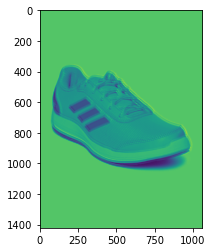

In [43]:
vis_shoe_one_channel(model, shoe)

Defines the 2D Convolution model by obtaining 1440x1080 Pixel 3 Channel input, with 1 3x3 Filter and 5x5 Max Pooling.
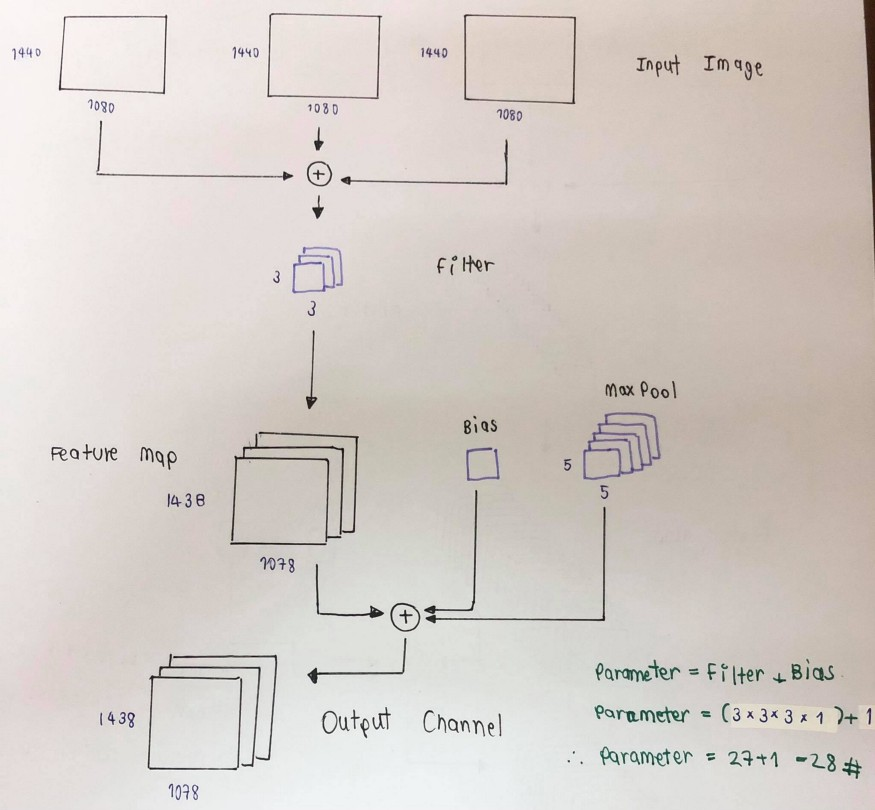

In [44]:
model = Sequential()
model.add(Conv2D(1, (3, 3), input_shape=shoe.shape))
model.add(MaxPool2D(pool_size=(5, 5)))

model.summary()

Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_9 (Conv2D)            (None, 1438, 1078, 1)     28        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 287, 215, 1)       0         
Total params: 28
Trainable params: 28
Non-trainable params: 0
_________________________________________________________________


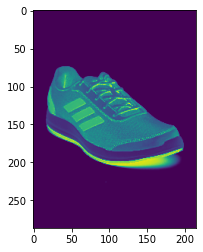

In [45]:
vis_shoe_one_channel(model, shoe)
#When you add Max Pooling, the image resolution is lower as the total collapse from 5x5 to 1 pixel.

2D Convolution Model Definition by 3x1080 Pixel 3 Channel Input Image with 1 3x3 Filter, Relu Activation Function and Max Pooling 5x5
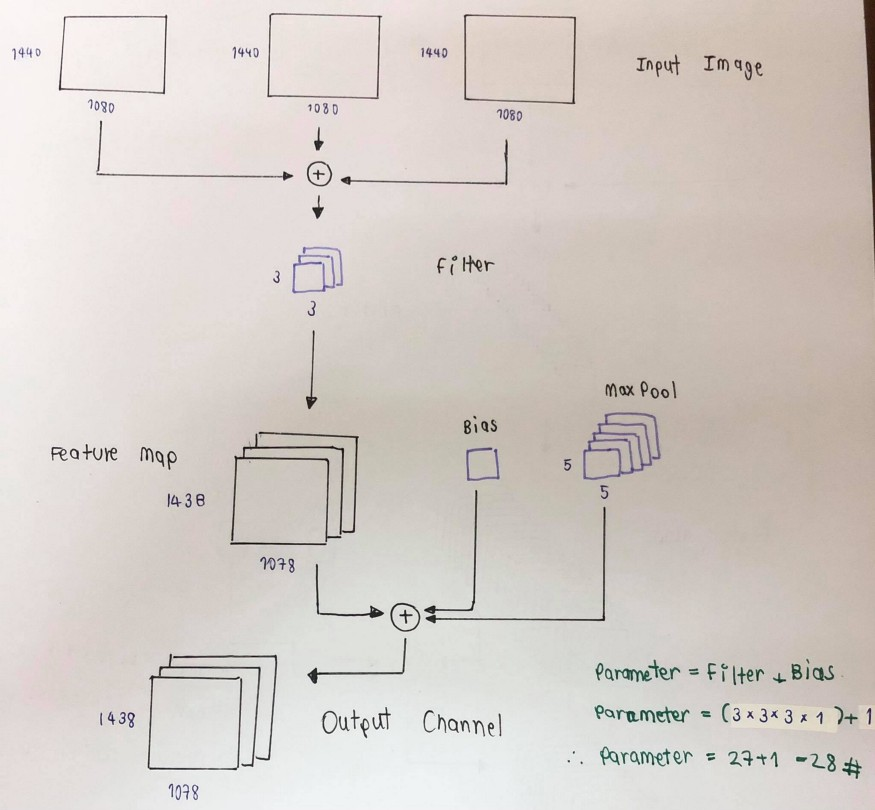

In [46]:
model = Sequential()
model.add(Conv2D(1, (3, 3), input_shape=shoe.shape))
model.add(Activation('relu'))
model.add(MaxPool2D(pool_size=(5, 5)))

model.summary()

Model: "sequential_10"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_10 (Conv2D)           (None, 1438, 1078, 1)     28        
_________________________________________________________________
activation_4 (Activation)    (None, 1438, 1078, 1)     0         
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 287, 215, 1)       0         
Total params: 28
Trainable params: 28
Non-trainable params: 0
_________________________________________________________________


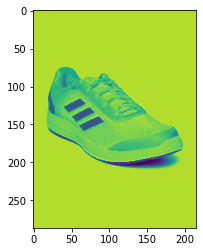

In [47]:
vis_shoe_one_channel(model, shoe)

2D Convolution, ReLu Activation Function, and Max Pooling 2 Layer Definition
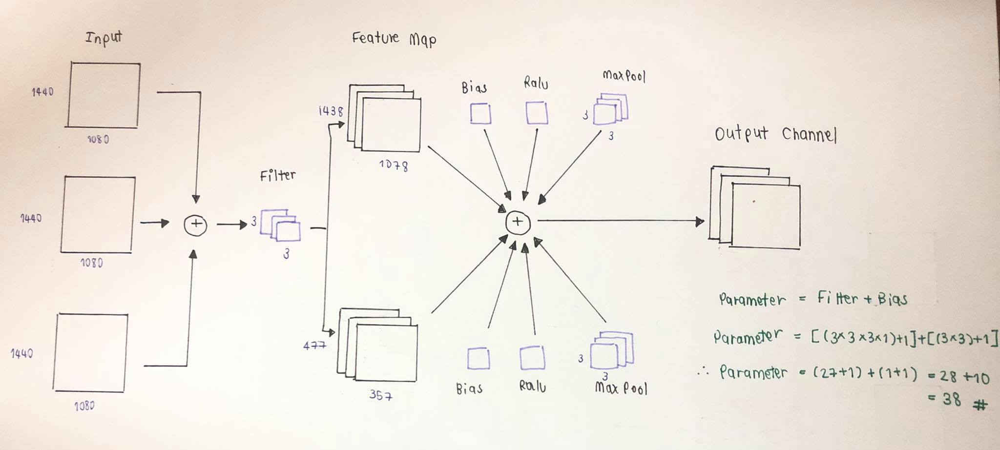

In [48]:
model = Sequential()
model.add(Conv2D(1, (3, 3), input_shape=shoe.shape))
model.add(Activation('relu'))
model.add(MaxPool2D(pool_size=(3, 3)))

model.add(Conv2D(1, (3, 3)))
model.add(Activation('relu'))
model.add(MaxPool2D(pool_size=(3, 3)))

model.summary()

Model: "sequential_11"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_11 (Conv2D)           (None, 1438, 1078, 1)     28        
_________________________________________________________________
activation_5 (Activation)    (None, 1438, 1078, 1)     0         
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 479, 359, 1)       0         
_________________________________________________________________
conv2d_12 (Conv2D)           (None, 477, 357, 1)       10        
_________________________________________________________________
activation_6 (Activation)    (None, 477, 357, 1)       0         
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 159, 119, 1)       0         
Total params: 38
Trainable params: 38
Non-trainable params: 0
_________________________________________________________

In [49]:
from tensorflow.keras.utils import plot_model

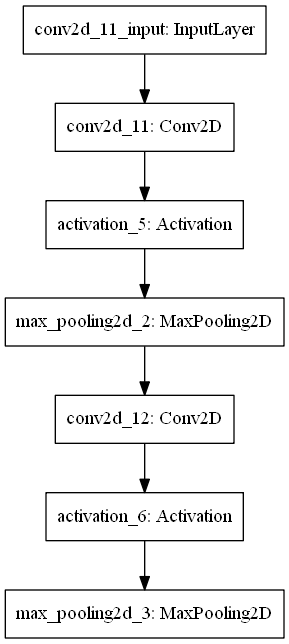

In [50]:
plot_model(model)

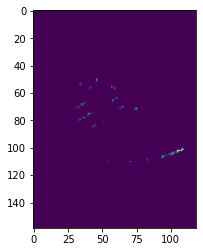

In [51]:
vis_shoe_one_channel(model, shoe)